# Convolutional Neural Networks

Sam Foreman [](https://orcid.org/0000-0002-9981-0876)
(\[[ANL](https://www.anl.gov/)\](<https://alcf.anl.gov/about/people/sam-foreman>))  
Huihuo ZhengCorey AdamsBethany Lusch2025-07-22

## Getting Started

[](https://colab.research.google.com/github/saforem2/intro-hpc-bootcamp/blob/main/content/01-neural-networks/2-conv-nets/index.ipynb)
[](https://github.com/saforem2/intro-hpc-bootcamp/blob/main/docs/01-neural-networks/2-conv-nets/README.md)

Up until transformers, convolutions were *the* state of the art in
computer vision.

In many ways and applications they still are!

Large Language Models, which are what we’ll focus on the rest of the
series after this lecture, are really good at ordered, \*tokenized data.
But there is lots of data that isn’t *implicitly* ordered like `images`,
and their more general cousins `graphs`.

Today’s lecture focuses on computer vision models, and particularly on
convolutional neural networks. There are a ton of applications you can
do with these, and not nearly enough time to get into them. Check out
the extra references file to see some publications to get you started if
you want to learn more.

Tip: this notebook is much faster on the GPU!

## Convolutional Networks: A brief historical context

The [ImageNet](https://www.image-net.org/) challenge was *the* driver of
the deep learning revolution in computer vision. When **AlexNet** (a
deep CNN) won in 2012, error rates fell off a cliff — and by 2015 models
had **surpassed human-level** accuracy. Today the benchmark is
essentially solved (top-5 error ~1%), and the frontier has moved on to
harder tasks.\[^image-net-historical\]

In [1]:
# This page uses the `bootcamp` helper package and `ezpz`. On Colab (or any
# fresh environment) install them; locally this is a no-op. `ezpz` is an optional
# extra (not a core `bootcamp` dependency), so we install it explicitly; it pulls
# in `ambivalent`/`seaborn` transitively.
try:
    import bootcamp  # noqa: F401
    import ezpz  # noqa: F401
except ImportError:
    %pip install -q "git+https://github.com/saforem2/ezpz" "git+https://github.com/saforem2/intro-hpc-bootcamp"

In [2]:
%load_ext autoreload
%autoreload 2
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('retina', 'svg', 'png')
import os
os.environ["TRUECOLOR"] = "1"
import matplotlib as mpl
# mpl.rcParams['figure.dpi'] = 400

In [3]:
import logging

import ambivalent
import ezpz
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from rich import print

sns.set_context("notebook")
# sns.set(rc={"figure.dpi": 400, "savefig.dpi": 400})
plt.style.use(ambivalent.STYLES["ambivalent"])
plt.rcParams["figure.figsize"] = [6.4, 4.8]
plt.rcParams["figure.facecolor"] = "none"

# house look (transparent + grey + Iosevka) for every figure on this page,
# plus the grid-diagram helpers used for the padding/pooling/channel figures
from bootcamp.plotly_theme import style_mpl, COLORS
from bootcamp.plots import draw_grid, new_grid_axes
style_mpl()

In [4]:
import plotly.graph_objects as go
from bootcamp.plotly_theme import apply_theme, COLORS
apply_theme()

# ImageNet top-5 classification error (%), winning entry each year
years = [2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2020, 2021]
error = [28.2, 25.8, 16.4, 11.7, 6.7, 3.6, 3.0, 2.3, 1.3, 1.0]
human = 5.1                       # Russakovsky et al. human top-5 error

# color the pre-deep-learning bars grey, deep-learning era in house blue,
# and the years that beat humans in green
def bar_color(y, e):
    if y < 2012:
        return COLORS["grey"]
    return COLORS["green"] if e < human else COLORS["blue"]

fig = go.Figure()
fig.add_bar(x=years, y=error, marker_color=[bar_color(y, e) for y, e in zip(years, error)],
            hovertemplate="%{x}: %{y}% top-5 error<extra></extra>", opacity=0.85)
fig.add_hline(y=human, line=dict(color=COLORS["red"], dash="dash", width=1.5),
              annotation_text="human ≈ 5%", annotation_position="top left",
              annotation_font_color=COLORS["red"])
fig.add_annotation(x=2012, y=16.4, text="AlexNet<br>(deep CNNs)", showarrow=True,
                   arrowhead=2, ax=40, ay=-40, font=dict(color=COLORS["grey"], size=11))
fig.update_layout(height=380, xaxis_title="Year", yaxis_title="Top-5 error (%)",
                  showlegend=False, bargap=0.25)
fig.show()

## Convolutional Building Blocks

In [5]:
import torch
import torchvision

We’re going to go through some examples of building blocks for
convolutional networks. To help illustate some of these, let’s use an
image for examples:

In [6]:
import os, urllib.request
from PIL import Image

# The project renders with execute-dir: project (cwd = content/), so reference the
# committed photo by its project-relative path. A few candidates cover local + Colab.
_candidates = [
    "01-neural-networks/2-conv-nets/ALCF-Staff.jpg",   # from project root (render cwd)
    "ALCF-Staff.jpg",                                  # from the page dir (Colab)
    "assets/ALCF-Staff.jpg",
]
_img = next((p for p in _candidates if os.path.exists(p)), None)
if _img is None:                                       # last resort (fresh Colab)
    _img = "ALCF-Staff.jpg"
    urllib.request.urlretrieve(
        "https://raw.githubusercontent.com/argonne-lcf/ai-science-training-series/"
        "main/03_intro_neural_networks/ALCF-Staff.jpg", _img)
alcf_image = Image.open(_img)

In [7]:
from matplotlib import pyplot as plt

fx, fy = plt.rcParamsDefault["figure.figsize"]
figure = plt.figure(figsize=(1.5 * fx, 1.5 * fy))
_ = plt.imshow(alcf_image)

### Convolutions

$$\begin{equation}
G\left[m, n\right] = \left(f \star h\right)\left[m, n\right] = \sum_{j} \sum_{k} h\left[j, k\right] f\left[m - j, n - k\right]
\end{equation}$$

Convolutions are a restriction of - and a specialization of - dense
linear layers. A convolution of an image produces another image, and
each output pixel is a function of only it’s local neighborhood of
points. This is called an *inductive bias* and is a big reason why
convolutions work for image data: neighboring pixels are correlated and
you can operate on just those pixels at a time.

$G\left[m, n\right] = \left(f \star h\right)\left[m, n\right] = \sum_{j} \sum_{k} h\left[j, k\right] f\left[m - j, n - k\right]$

See examples of convolutions
[here](https://github.com/vdumoulin/conv_arithmetic)

<figure>
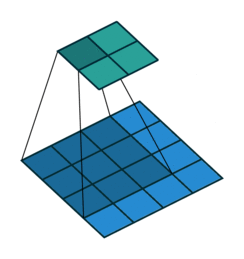
<figcaption aria-hidden="true">image.png</figcaption>
</figure>

In [8]:
# Let's apply a convolution to the ALCF Staff photo:
alcf_tensor = torchvision.transforms.ToTensor()(alcf_image)

# Reshape the tensor to have a batch size of 1:
alcf_tensor = alcf_tensor.reshape((1,) + alcf_tensor.shape)

# Create a random convolution:
# shape is: (channels_in, channels_out, kernel_x, kernel_y)
conv_random = torch.rand((3, 3, 15, 15))

alcf_rand = torch.nn.functional.conv2d(alcf_tensor, conv_random)
alcf_rand = (1.0 / alcf_rand.max()) * alcf_rand
print(alcf_rand.shape)
alcf_rand = alcf_rand.reshape(alcf_rand.shape[1:])

print(alcf_tensor.shape)

rand_image = alcf_rand.permute((1, 2, 0)).cpu()
fx, fy = plt.rcParamsDefault["figure.figsize"]
figure = plt.figure(figsize=(1.5 * fx, 1.5 * fy))
_ = plt.imshow(rand_image)

torch.Size ([ 1 , 3 , 1111 , 1986 ])

torch.Size ([ 1 , 3 , 1125 , 2000 ])

### Normalization

Normalization is the act of transforming the mean and moment of your
data to standard values (usually 0.0 and 1.0). It’s particularly useful
in machine learning since it stabilizes training, and allows higher
learning rates.

<figure>
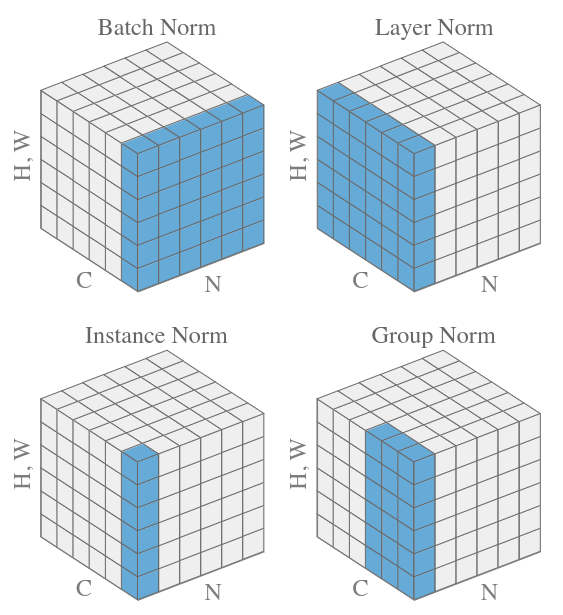
<figcaption aria-hidden="true">Batch Norm</figcaption>
</figure>

Figure 2: Reference:
[Normalizations](https://arxiv.org/pdf/1903.10520.pdf)

In [9]:
import plotly.graph_objects as go
steps = np.linspace(0, 30, 200)          # millions of training steps
# schematic accuracy curves: BN variants rise faster than plain Inception
def curve(rate, ceiling=0.74):
    return ceiling * (1 - np.exp(-rate * steps)) + 0.02 * np.exp(-steps)
fig = go.Figure()
series = [("Inception", 0.12, COLORS["grey"]),
          ("BN-Baseline", 0.22, COLORS["red"]),
          ("BN-x5", 0.55, COLORS["purple"]),
          ("BN-x30", 0.9, COLORS["blue"])]
for name, rate, col in series:
    fig.add_scatter(x=steps, y=curve(rate), mode="lines", name=name, line=dict(color=col, width=2))
# marker: steps needed to hit Inception's final accuracy
target = curve(0.12)[-1]
for name, rate, col in series:
    y = curve(rate); hit = steps[np.argmax(y >= target)]
    fig.add_scatter(x=[hit], y=[target], mode="markers", showlegend=False,
                    marker=dict(color=col, size=9, symbol="diamond"))
fig.update_layout(xaxis_title="training steps (millions)", yaxis_title="validation accuracy",
                  height=380, yaxis=dict(range=[0.4, 0.8]),
                  legend=dict(x=0.98, y=0.02, xanchor="right", yanchor="bottom"))
fig.show()

Schematic reproduction of the classic result from [Batch Normalization
(Ioffe & Szegedy, 2015)](https://arxiv.org/pdf/1502.03167.pdf): the
diamonds mark how few steps each BN variant needs to match plain
Inception’s final accuracy.

In [10]:
# Let's apply a normalization to the ALCF Staff photo:
alcf_tensor = torchvision.transforms.ToTensor()(alcf_image)
# Reshape the tensor to have a batch size of 1:
alcf_tensor = alcf_tensor.reshape((1,) + alcf_tensor.shape)
# Standardize: subtract the per-channel mean and divide by the per-channel std,
# so each channel ends up with mean 0 and std 1 (exactly the transform described
# above). We reduce over the batch + spatial dims and keep the channel dim.
mean = alcf_tensor.mean(dim=(0, 2, 3), keepdim=True)
std = alcf_tensor.std(dim=(0, 2, 3), keepdim=True)
alcf_norm = (alcf_tensor - mean) / std
print(alcf_tensor.shape)
print(f"per-channel mean: {alcf_norm.mean(dim=(0, 2, 3))}")  # ~[0, 0, 0]
print(f"per-channel std:  {alcf_norm.std(dim=(0, 2, 3))}")   # ~[1, 1, 1]
alcf_norm = alcf_norm.reshape(alcf_norm.shape[1:])
# Standardized values are centered on 0 (and go negative), so rescale to [0, 1]
# just for display — imshow expects floats in that range.
disp = (alcf_norm - alcf_norm.min()) / (alcf_norm.max() - alcf_norm.min())
norm_image = disp.permute((1, 2, 0)).cpu()
fx, fy = plt.rcParamsDefault["figure.figsize"]
figure = plt.figure(figsize=(1.5 * fx, 1.5 * fy))
_ = plt.imshow(norm_image)

torch.Size ([ 1 , 3 , 1125 , 2000 ])

per-channel mean: tensor ([ -5.9462e-08 , -1.3672e-08 , -5.8051e-08 ])

per-channel std: tensor ([ 1.0000 , 1.0000 , 1.0000 ])

### Downsampling (And upsampling)

Downsampling is a critical component of convolutional and many vision
models. Because of the local-only nature of convolutional filters,
learning large-range features can be too slow for convergence.
Downsampling of layers can bring information from far away closer,
effectively changing what it means to be “local” as the input to a
convolution.

In [11]:
grid = np.array([[29, 15, 28, 184],
                 [0, 100, 70, 38],
                 [12, 12, 7, 2],
                 [12, 12, 45, 6]])
quad = {(0, 0): "#A5D6A7", (0, 1): "#EF9A9A", (1, 0): "#FFCC80", (1, 1): "#90CAF9"}
cols = [[quad[(r // 2, c // 2)] for c in range(4)] for r in range(4)]

def pooled(fn):
    return np.array([[fn(grid[:2, :2]), fn(grid[:2, 2:])],
                     [fn(grid[2:, :2]), fn(grid[2:, 2:])]])
ocols = [["#A5D6A7", "#EF9A9A"], ["#FFCC80", "#90CAF9"]]

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
for ax, (title, fn) in zip(axes, [("Max Pooling", np.max),
                                  ("Average Pooling", lambda a: int(a.mean()))]):
    ax.set_aspect("equal"); ax.axis("off"); ax.set_title(title, color=COLORS["grey"])
    draw_grid(ax, grid.tolist(), cols, origin_xy=(0, 0))
    out = pooled(fn)
    draw_grid(ax, out.tolist(), ocols, origin_xy=(1, -5.2))
    ax.annotate("", xy=(2, -5.0), xytext=(2, -4.2),
                arrowprops=dict(arrowstyle="-|>", color=COLORS["grey"], lw=2))
    ax.text(3.1, -4.6, "2×2\npool", ha="left", va="center", color=COLORS["grey"], fontsize=10)
    ax.set_xlim(-0.3, 5); ax.set_ylim(-7.5, 0.6)
plt.show()

In [12]:
# Let's apply a normalization to the ALCF Staff photo:
alcf_tensor = torchvision.transforms.ToTensor()(alcf_image)
# Reshape the tensor to have a batch size of 1:
alcf_tensor = alcf_tensor.reshape((1,) + alcf_tensor.shape)
alcf_rand = torch.nn.functional.max_pool2d(alcf_tensor, 2)
alcf_rand = alcf_rand.reshape(alcf_rand.shape[1:])
print(alcf_tensor.shape)
rand_image = alcf_rand.permute((1, 2, 0)).cpu()
fx, fy = plt.rcParamsDefault["figure.figsize"]
figure = plt.figure(figsize=(1.5 * fx, 1.5 * fy))
_ = plt.imshow(rand_image)

torch.Size ([ 1 , 3 , 1125 , 2000 ])

### More Building Blocks: Padding, Pooling & Channels

A few more concepts that show up in almost every ConvNet:

### Padding

Adds zeros along the corners of the image to preserve the dimensionality
of the input.

In [13]:
import numpy as np
from matplotlib.patches import Rectangle

n = 8
vals = [["0" if (r in (0, n-1) or c in (0, n-1)) else "" for c in range(n)] for r in range(n)]
cols = [["#EF9A9A" if (r in (0, n-1) or c in (0, n-1)) else "#FFFFFF00"
         for c in range(n)] for r in range(n)]
fig, ax = new_grid_axes(figsize=(5.2, 5.2))
w, h = draw_grid(ax, vals, cols, fontsize=11)
# red outline around the inner "original 6x6"
ax.add_patch(Rectangle((1, -7), 6, 6, fill=False, edgecolor="#E53935", linewidth=2.5))
ax.text(4, -4, "original 6×6", ha="center", va="center", color="#E53935", fontsize=12)
ax.annotate("zero\npadding", xy=(0.5, -0.5), xytext=(-1.8, 0.2), fontsize=11,
            color=COLORS["grey"], ha="center",
            arrowprops=dict(arrowstyle="-|>", color=COLORS["grey"]))
ax.text(4, -8.5, "final 8×8", ha="center", va="center", color=COLORS["grey"], fontsize=12)
ax.set_xlim(-3, 9); ax.set_ylim(-9.2, 0.5)
plt.show()

### What is the output size ?

$$(\mathrm{N} - \mathrm{F} + 2\mathrm{P}) / \mathrm{S} + 1$$

- where
  - $N$ = dimension of the input image. (ex, for an image of `28x28x1`,
    $N=28$)
  - $F$ = dimension of the filter ($F=3$ for a filter of `3x3`)
  - $S$ = Stride value
  - $P$ = Size of the zero padding used

### Max Pooling

Pooling reduces the dimensionality of the images, with max-pooling being
one of the most widely used.

In [14]:
inp = np.array([[12, 20, 30, 0],
                [8, 12, 2, 0],
                [34, 70, 37, 4],
                [112, 100, 25, 12]])
# color each 2x2 quadrant
quad = {(0, 0): "#EF9A9A", (0, 1): "#FFF59D", (1, 0): "#B39DDB", (1, 1): "#A5D6A7"}
cols = [[quad[(r // 2, c // 2)] for c in range(4)] for r in range(4)]
out = np.array([[inp[:2, :2].max(), inp[:2, 2:].max()],
                [inp[2:, :2].max(), inp[2:, 2:].max()]])
ocols = [["#EF9A9A", "#FFF59D"], ["#B39DDB", "#A5D6A7"]]

fig, ax = new_grid_axes(figsize=(7.5, 4))
draw_grid(ax, inp.tolist(), cols, origin_xy=(0, 0))
draw_grid(ax, out.tolist(), ocols, origin_xy=(7, -1))   # offset to the right
ax.annotate("", xy=(6.8, -2), xytext=(4.3, -2),
            arrowprops=dict(arrowstyle="-|>", color=COLORS["grey"], lw=2))
ax.text(5.5, -1.5, "2×2\nmax-pool", ha="center", va="center", color=COLORS["grey"], fontsize=11)
ax.set_xlim(-0.3, 9.3); ax.set_ylim(-4.3, 0.3)
plt.show()

### Multiple Channels

Usually colored images have multiple channels with RGB values. What
happens to the filter sizes and activation map dimensions in those
cases?

In [15]:
from matplotlib.patches import Polygon

def iso_box(ax, x, y, w, h, d, color):
    """A simple isometric box: front face (w×h) with a depth offset d."""
    dx, dy = d * 0.4, d * 0.4
    front = Polygon([(x, y), (x + w, y), (x + w, y + h), (x, y + h)],
                    closed=True, facecolor=color, edgecolor="#6b5320", lw=1)
    top = Polygon([(x, y + h), (x + w, y + h), (x + w + dx, y + h + dy), (x + dx, y + h + dy)],
                  closed=True, facecolor="#c79a3a", edgecolor="#6b5320", lw=1)
    side = Polygon([(x + w, y), (x + w + dx, y + dy), (x + w + dx, y + h + dy), (x + w, y + h)],
                   closed=True, facecolor="#a87f28", edgecolor="#6b5320", lw=1)
    for p in (top, side, front):
        ax.add_patch(p)

fig, ax = new_grid_axes(figsize=(10, 4.2))
GOLD = "#D4A83C"
iso_box(ax, 0,   0,   2.2, 3.2, 0.5, GOLD)   # 32x32x3
iso_box(ax, 6,   0.3, 2.6, 2.6, 1.6, GOLD)   # 26x26x10
iso_box(ax, 12,  0.9, 1.4, 1.4, 1.0, GOLD)   # ?
# dimension labels
for (lx, ly, t) in [(2.4,1.6,"32"),(1.0,-0.5,"32"),(-0.4,0.1,"3"),
                    (8.8,1.6,"26"),(7.2,-0.2,"26"),(6.4,0.0,"10")]:
    ax.text(lx, ly, t, fontsize=10, color=COLORS["grey"])
ax.text(13.0, 1.8, "?", fontsize=26, color="#222", ha="center", fontweight="bold")
# arrows + filter annotations
for (x0, x1, lines) in [(3.0, 5.8, ["10 filters", "7×7×3", "stride 1"]),
                        (9.2, 11.6, ["6 filters", "5×5×10", "stride 2"])]:
    ax.annotate("", xy=(x1, 1.6), xytext=(x0, 1.6),
                arrowprops=dict(arrowstyle="-|>", color=COLORS["grey"], lw=1.8))
    ax.text((x0 + x1) / 2, 2.9, "\n".join(lines), ha="center", va="top",
            fontsize=9.5, color=COLORS["grey"])
ax.set_xlim(-1, 15); ax.set_ylim(-1, 5)
plt.show()

### Visualizing learned features from CNNs

The filters from the initial hidden layers tend to learn low level
features like edges, corners, shapes, colors etc. Filters from the
deeper layers tend to learn high-level features detecting patterns like
wheel, car, etc.

<figure id="fig-conv-nets-feature-maps">
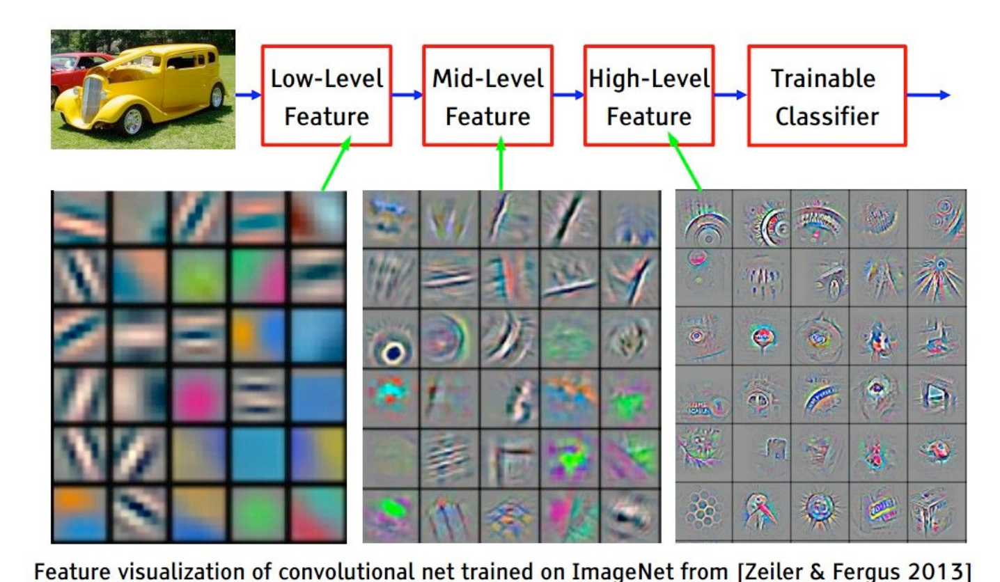
<figcaption>Figure 8</figcaption>
</figure>

### Residual Connections

One issue, quickly encountered when making convolutional networks deeper
and deeper, is the “Vanishing Gradients” problem. As layers were stacked
on top of each other, the size of updates dimished at the earlier layers
of a convolutional network. The paper “Deep Residual Learning for Image
Recognition” solved this by introduction “residual connections” as skip
layers.

Reference: [Deep Residual Learning for Image
Recognition](https://arxiv.org/pdf/1512.03385.pdf)

<figure id="fig-residual-layer">
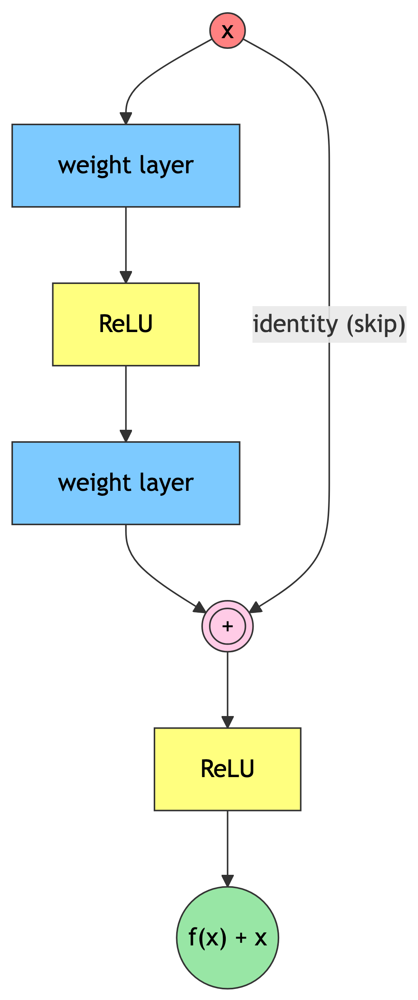
<figcaption>Figure 9: A residual block: the input <code>x</code> is
added back to the output of the weight layers via a <strong>skip
connection</strong>, so the block learns
<code>f(x) + x</code>.</figcaption>
</figure>

Compare the performance of the models before and after the introduction
of these layers:

<figure id="fig-resnet-performance">
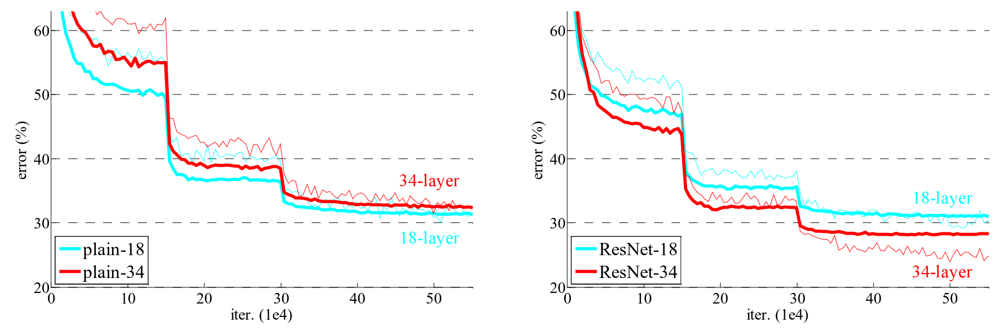
<figcaption>Figure 10</figcaption>
</figure>

If you have time to read only one paper on computer vision, make it this
one! Resnet was the first model to beat human accuracy on ImageNet and
is one of the most impactful papers in AI ever published.

## Building a ConvNet

In this section we’ll build and apply a conv net to the mnist dataset.
The layers here are loosely based off of the ConvNext architecture. Why?
Because we’re getting into LLM’s soon, and this ConvNet uses LLM
features. ConvNext is an update to the ResNet architecture that
outperforms it.

[ConvNext](https://arxiv.org/abs/2201.03545)

The dataset here is
[Fashion-MNIST](https://github.com/zalandoresearch/fashion-mnist) —
28×28 grayscale images of clothing in 10 classes. It’s a drop-in,
slightly harder replacement for MNIST that’s still small enough to
download and train on a CPU in seconds (unlike the heavier CIFAR-10
color images).

In [16]:
batch_size = 16
from torchvision import transforms

# Fashion-MNIST: 28×28 grayscale images in 10 clothing classes. Small enough to
# download + train quickly on a CPU (CIFAR-10 is 3×32×32 and much heavier).
transform = transforms.Compose(
    [transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))],
)
training_data = torchvision.datasets.FashionMNIST(
    root="data",
    download=True,
    train=True,
    transform=transform,
)

test_data = torchvision.datasets.FashionMNIST(
    root="data",
    download=True,
    train=False,
    transform=transform,
)

training_data, validation_data = torch.utils.data.random_split(
    training_data, [0.8, 0.2], generator=torch.Generator().manual_seed(55)
)

# The dataloader makes our dataset iterable
train_dataloader = torch.utils.data.DataLoader(
    training_data,
    batch_size=batch_size,
    pin_memory=True,
    shuffle=True,
    num_workers=0,
)
val_dataloader = torch.utils.data.DataLoader(
    validation_data,
    batch_size=batch_size,
    pin_memory=True,
    shuffle=False,
    num_workers=0,
)
classes = (
    "T-shirt",
    "Trouser",
    "Pullover",
    "Dress",
    "Coat",
    "Sandal",
    "Shirt",
    "Sneaker",
    "Bag",
    "Ankle boot",
)

In [17]:
batch, (X, Y) = next(enumerate(train_dataloader))
plt.imshow(X[0].cpu().squeeze(), cmap="gray")   # 1×28×28 grayscale
plt.show()

/Users/samforeman/projects/saforem2/intro-hpc-bootcamp-2025/.venv/lib/python3.13/site-packages/torch/utils/data/dataloader.py:683: UserWarning:

'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.


In [18]:
import numpy as np


def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# get some random training images
images, labels = next(iter(train_dataloader))

fx, fy = plt.rcParamsDefault["figure.figsize"]
fig = plt.figure(figsize=(2 * fx, 4 * fy))
# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print("\n" + " ".join(f"{classes[labels[j]]:5s}" for j in range(batch_size)))

Coat Coat Sandal T-shirt Ankle boot Ankle boot Ankle boot Trouser Ankle boot Bag Coat Trouser Ankle boot Ankle
boot Sandal T-shirt

This code below is important as our models get bigger: this is wrapping
the pytorch data loaders to put the data onto the GPU!

In [19]:
dev = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")


def preprocess(x, y):
    # Fashion-MNIST is *grayscale* 28×28, so 1 channel
    x = x.view(-1, 1, 28, 28)
    #  y = y.to(dtype)
    return (x.to(dev), y.to(dev))


class WrappedDataLoader:
    def __init__(self, dl, func):
        self.dl = dl
        self.func = func

    def __len__(self):
        return len(self.dl)

    def __iter__(self):
        for b in self.dl:
            yield (self.func(*b))


train_dataloader = WrappedDataLoader(train_dataloader, preprocess)
val_dataloader = WrappedDataLoader(val_dataloader, preprocess)

In [20]:
from typing import Optional

from torch import nn


class Downsampler(nn.Module):
    def __init__(self, in_channels, out_channels, shape, stride=2):
        super(Downsampler, self).__init__()
        self.norm = nn.LayerNorm([in_channels, *shape])
        self.downsample = nn.Conv2d(
            in_channels=in_channels,
            out_channels=out_channels,
            kernel_size=stride,
            stride=stride,
        )

    def forward(self, inputs):
        return self.downsample(self.norm(inputs))


class ConvNextBlock(nn.Module):
    """This block of operations is loosely based on this paper:"""

    def __init__(
        self,
        in_channels,
        shape,
        kernel_size: Optional[None] = None,
    ):
        super(ConvNextBlock, self).__init__()
        # Depthwise, seperable convolution with a large number of output filters:
        kernel_size = [7, 7] if kernel_size is None else kernel_size
        self.conv1 = nn.Conv2d(
            in_channels=in_channels,
            out_channels=in_channels,
            groups=in_channels,
            kernel_size=kernel_size,
            padding="same",
        )
        self.norm = nn.LayerNorm([in_channels, *shape])
        # Two more convolutions:
        self.conv2 = nn.Conv2d(
            in_channels=in_channels, out_channels=4 * in_channels, kernel_size=1
        )
        self.conv3 = nn.Conv2d(
            in_channels=4 * in_channels, out_channels=in_channels, kernel_size=1
        )

    def forward(self, inputs):
        x = self.conv1(inputs)
        # The normalization layer:
        x = self.norm(x)
        x = self.conv2(x)
        # The non-linear activation layer:
        x = torch.nn.functional.gelu(x)
        x = self.conv3(x)
        # This makes it a residual network:
        return x + inputs


class Classifier(nn.Module):
    def __init__(
        self,
        n_initial_filters,
        n_stages,
        blocks_per_stage,
        kernel_size: Optional[None] = None,
    ):
        super(Classifier, self).__init__()
        # This is a downsampling convolution that will produce patches of output.
        # This is similar to what vision transformers do to tokenize the images.
        self.stem = nn.Conv2d(
            in_channels=1, out_channels=n_initial_filters, kernel_size=1, stride=1
        )
        current_shape = [28, 28]
        self.norm1 = nn.LayerNorm([n_initial_filters, *current_shape])
        # self.norm1 = WrappedLayerNorm()
        current_n_filters = n_initial_filters
        self.layers = nn.Sequential()
        for i, n_blocks in enumerate(range(n_stages)):
            # Add a convnext block series:
            for _ in range(blocks_per_stage):
                self.layers.append(
                    ConvNextBlock(
                        in_channels=current_n_filters,
                        shape=current_shape,
                        kernel_size=kernel_size,
                    )
                )
            # Add a downsampling layer:
            if i != n_stages - 1:
                # Skip downsampling if it's the last layer!
                self.layers.append(
                    Downsampler(
                        in_channels=current_n_filters,
                        out_channels=2 * current_n_filters,
                        shape=current_shape,
                    )
                )
                # Double the number of filters:
                current_n_filters = 2 * current_n_filters
                # Cut the shape in half:
                current_shape = [cs // 2 for cs in current_shape]
        self.head = nn.Sequential(
            nn.Flatten(),
            nn.LayerNorm(current_n_filters),
            nn.Linear(current_n_filters, 10),
        )
        # self.norm2 = nn.InstanceNorm2d(current_n_filters)
        # # This brings it down to one channel / class
        # self.bottleneck = nn.Conv2d(in_channels=current_n_filters, out_channels=10,
        #                                   kernel_size=1, stride=1)

    def forward(self, x):
        x = self.stem(x)
        # Apply a normalization after the initial patching:
        x = self.norm1(x)
        # Apply the main chunk of the network:
        x = self.layers(x)
        # Normalize and readout:
        x = nn.functional.avg_pool2d(x, x.shape[2:])
        x = self.head(x)
        return x

        # x = self.norm2(x)
        # x = self.bottleneck(x)

        # # Average pooling of the remaining spatial dimensions (and reshape) makes this label-like:
        # return nn.functional.avg_pool2d(x, kernel_size=x.shape[-2:]).reshape((-1,10))

In [21]:
from torchinfo import summary

model = Classifier(32, 4, 2, kernel_size=(2, 2))
model.to(device=dev)
print(f"\n{summary(model, input_size=(batch_size, 1, 28, 28))}")

/Users/samforeman/projects/saforem2/intro-hpc-bootcamp-2025/.venv/lib/python3.13/site-packages/torch/nn/modules/conv.py:549: UserWarning:

Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/Convolution.cpp:1037.)


==========================================================================================
Layer ( typ e:de pth-idx ) Output Shape Param #
==========================================================================================
Classifier [ 16 , 10 ] --
├─Conv2d: 1 - 1 [ 16 , 32 , 28 , 28 ] 64 
├─LayerNorm: 1 - 2 [ 16 , 32 , 28 , 28 ] 50 , 176 
├─Sequential: 1 - 3 [ 16 , 256 , 3 , 3 ] --
│ └─ConvNextBlock: 2 - 1 [ 16 , 32 , 28 , 28 ] --
│ │ └─Conv2d: 3 - 1 [ 16 , 32 , 28 , 28 ] 160 
│ │ └─LayerNorm: 3 - 2 [ 16 , 32 , 28 , 28 ] 50 , 176 
│ │ └─Conv2d: 3 - 3 [ 16 , 128 , 28 , 28 ] 4 , 224 
│ │ └─Conv2d: 3 - 4 [ 16 , 32 , 28 , 28 ] 4 , 128 
│ └─ConvNextBlock: 2 - 2 [ 16 , 32 , 28 , 28 ] --
│ │ └─Conv2d: 3 - 5 [ 16 , 32 , 28 , 28 ] 160 
│ │ └─LayerNorm: 3 - 6 [ 16 , 32 , 28 , 28 ] 50 , 176 
│ │ └─Conv2d: 3 - 7 [ 16 , 128 , 28 , 28 ] 4 , 224 
│ │ └─Conv2d: 3 - 8 [ 16 , 32 , 28 , 28 ] 4 , 128 
│ └─Downsampler: 2 - 3 [ 16 , 64 , 14 , 14 ] --
│ │ └─LayerNorm: 3 - 9 [ 16 , 32 , 28 , 28 ] 50 , 176 
│ │ └─Conv2d: 3 - 10 [ 16 , 64 , 14 , 14 ] 8 , 256 
│ └─ConvNextBlock: 2 - 4 [ 16 , 64 , 14 , 14 ] --
│ │ └─Conv2d: 3 - 11 [ 16 , 64 , 14 , 14 ] 320 
│ │ └─LayerNorm: 3 - 12 [ 16 , 64 , 14 , 14 ] 25 , 088 
│ │ └─Conv2d: 3 - 13 [ 16 , 256 , 14 , 14 ] 16 , 640 
│ │ └─Conv2d: 3 - 14 [ 16 , 64 , 14 , 14 ] 16 , 448 
│ └─ConvNextBlock: 2 - 5 [ 16 , 64 , 14 , 14 ] --
│ │ └─Conv2d: 3 - 15 [ 16 , 64 , 14 , 14 ] 320 
│ │ └─LayerNorm: 3 - 16 [ 16 , 64 , 14 , 14 ] 25 , 088 
│ │ └─Conv2d: 3 - 17 [ 16 , 256 , 14 , 14 ] 16 , 640 
│ │ └─Conv2d: 3 - 18 [ 16 , 64 , 14 , 14 ] 16 , 448 
│ └─Downsampler: 2 - 6 [ 16 , 128 , 7 , 7 ] --
│ │ └─LayerNorm: 3 - 19 [ 16 , 64 , 14 , 14 ] 25 , 088 
│ │ └─Conv2d: 3 - 20 [ 16 , 128 , 7 , 7 ] 32 , 896 
│ └─ConvNextBlock: 2 - 7 [ 16 , 128 , 7 , 7 ] --
│ │ └─Conv2d: 3 - 21 [ 16 , 128 , 7 , 7 ] 640 
│ │ └─LayerNorm: 3 - 22 [ 16 , 128 , 7 , 7 ] 12 , 544 
│ │ └─Conv2d: 3 - 23 [ 16 , 512 , 7 , 7 ] 66 , 048 
│ │ └─Conv2d: 3 - 24 [ 16 , 128 , 7 , 7 ] 65 , 664 
│ └─ConvNextBlock: 2 - 8 [ 16 , 128 , 7 , 7 ] --
│ │ └─Conv2d: 3 - 25 [ 16 , 128 , 7 , 7 ] 640 
│ │ └─LayerNorm: 3 - 26 [ 16 , 128 , 7 , 7 ] 12 , 544 
│ │ └─Conv2d: 3 - 27 [ 16 , 512 , 7 , 7 ] 66 , 048 
│ │ └─Conv2d: 3 - 28 [ 16 , 128 , 7 , 7 ] 65 , 664 
│ └─Downsampler: 2 - 9 [ 16 , 256 , 3 , 3 ] --
│ │ └─LayerNorm: 3 - 29 [ 16 , 128 , 7 , 7 ] 12 , 544 
│ │ └─Conv2d: 3 - 30 [ 16 , 256 , 3 , 3 ] 131 , 328 
│ └─ConvNextBlock: 2 - 10 [ 16 , 256 , 3 , 3 ] --
│ │ └─Conv2d: 3 - 31 [ 16 , 256 , 3 , 3 ] 1 , 280 
│ │ └─LayerNorm: 3 - 32 [ 16 , 256 , 3 , 3 ] 4 , 608 
│ │ └─Conv2d: 3 - 33 [ 16 , 1024 , 3 , 3 ] 263 , 168 
│ │ └─Conv2d: 3 - 34 [ 16 , 256 , 3 , 3 ] 262 , 400 
│ └─ConvNextBlock: 2 - 11 [ 16 , 256 , 3 , 3 ] --
│ │ └─Conv2d: 3 - 35 [ 16 , 256 , 3 , 3 ] 1 , 280 
│ │ └─LayerNorm: 3 - 36 [ 16 , 256 , 3 , 3 ] 4 , 608 
│ │ └─Conv2d: 3 - 37 [ 16 , 1024 , 3 , 3 ] 263 , 168 
│ │ └─Conv2d: 3 - 38 [ 16 , 256 , 3 , 3 ] 262 , 400 
├─Sequential: 1 - 4 [ 16 , 10 ] --
│ └─Flatten: 2 - 12 [ 16 , 256 ] --
│ └─LayerNorm: 2 - 13 [ 16 , 256 ] 512 
│ └─Linear: 2 - 14 [ 16 , 10 ] 2 , 570 
==========================================================================================
Total params: 1 , 900 , 682 
Trainable params: 1 , 900 , 682 
Non-trainable params: 0 
Total mult-adds ( Units.MEGABYTES ) : 858.95 
==========================================================================================
Input size ( MB ) : 0.05 
Forward/backward pass size ( MB ) : 97.58 
Params size ( MB ) : 7.60 
Estimated Total Size ( MB ) : 105.24 
==========================================================================================

In [22]:
def evaluate(dataloader, model, loss_fn, val_bar):
    # Set the model to evaluation mode - some NN pieces behave differently during training
    # Unnecessary in this situation but added for best practices
    model.eval()
    size = len(dataloader)
    num_batches = len(dataloader)
    loss, correct = 0, 0

    # We can save computation and memory by not calculating gradients here - we aren't optimizing
    with torch.no_grad():
        # loop over all of the batches
        for x, y in dataloader:
            t0 = time.perf_counter()
            pred = model(x.to(DTYPE))
            t1 = time.perf_counter()
            loss += loss_fn(pred, y).item()
            # how many are correct in this batch? Tracking for accuracy
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()
            t3 = time.perf_counter()
            val_bar.update()

    loss /= num_batches
    correct /= size * batch_size

    accuracy = 100 * correct
    return accuracy, loss

In [23]:
import time

from torch import nn

# float32 on CPU — CPUs have no native bfloat16 matmul, so bf16 is emulated and
# runs 10-50× slower. On a GPU you'd use torch.bfloat16 here instead.
DEVICE = ezpz.get_torch_device_type()
DTYPE = torch.bfloat16 if DEVICE in ("cuda", "xpu") else torch.float32

loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=2.5e-4)

In [24]:
def eval_step(x, y):
    with torch.no_grad():
        t0 = time.perf_counter()
        pred = model(x.to(DTYPE))
        t1 = time.perf_counter()
        loss = loss_fn(pred, y).item()
        correct = (pred.argmax(1) == y).type(torch.float).sum().item()
        t2 = time.perf_counter()
    return {
        "loss": loss,
        "acc": correct / y.shape[0],
        "dtf": t1 - t0,
        "dtm": t2 - t1,
    }

In [25]:
def train_step(x, y):
    t0 = time.perf_counter()
    # Forward pass
    with torch.autocast(dtype=DTYPE, device_type=DEVICE):
        pred = model(x.to(DTYPE))
    loss = loss_fn(pred, y)
    t1 = time.perf_counter()

    # Backward pass
    loss.backward()
    t2 = time.perf_counter()

    # Update weights
    optimizer.step()
    t3 = time.perf_counter()

    # Reset gradients
    optimizer.zero_grad()
    t4 = time.perf_counter()

    return loss.item(), {
        "dtf": t1 - t0,
        "dtb": t2 - t1,
        "dtu": t3 - t2,
        "dtz": t4 - t3,
    }

In [26]:
def train_one_epoch(
    dataloader, model, loss_fn, optimizer, progress_bar, history: ezpz.History | None
):
    model.train()
    t0 = time.perf_counter()
    batch_metrics = {}
    for batch, (X, y) in enumerate(dataloader):
        loss, metrics = train_step(X, y)
        progress_bar.update()
        metrics = {"bidx": batch, "loss": loss, **metrics}
        batch_metrics[batch] = metrics
        if history is not None:
            print(history.update(metrics))
    t1 = time.perf_counter()
    batch_metrics |= {"dt_batch": t1 - t0}
    # if history is not None:
    #     _ = history.update({"dt_batch": t1 - t0})
    return batch_metrics

In [27]:
_ = model.to(DTYPE)

In [28]:
_x, _y = next(iter(val_dataloader))
print(f"{eval_step(_x.to(DTYPE), _y)}")

/Users/samforeman/projects/saforem2/intro-hpc-bootcamp-2025/.venv/lib/python3.13/site-packages/torch/utils/data/dataloader.py:683: UserWarning:

'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.


{ 'loss' : 2.2841718196868896 , 'acc' : 0.25 , 'dtf' : 0.11664983304217458 , 'dtm' : 0.00018258299678564072 }

In [29]:
print(f"{_x.shape=}, {_y.shape=}")
_pred = model(_x.to(DTYPE))
_loss = loss_fn(_pred, _y).item()
_correct = (_pred.argmax(1) == _y).type(torch.float).sum().item()
print(
    {
        # "pred": _pred,
        "loss": _loss,
        "pred.argmax(1)": _pred.argmax(1),
        "pred.argmax(1) == y": (_pred.argmax(1) == _y),
        "correct": _correct,
        "acc": _correct / _y.shape[0],
    }
)

_x. shape = torch .Size ([ 16 , 1 , 28 , 28 ]) , _y. shape = torch .Size ([ 16 ])

{ 
 'loss' : 2.2841718196868896 ,
 'pred.argmax(1)' : tensor ([ 2 , 6 , 2 , 6 , 2 , 6 , 6 , 6 , 2 , 6 , 6 , 6 , 6 , 2 , 6 , 2 ]) ,
 'pred.argmax(1) == y' : tensor ([ True , False , False , False , False , False , False , False , False , False ,
 False , False , True , True , False , True ]) ,
 'correct' : 4.0 ,
 'acc' : 0.25 
 }

## Run Training

In [30]:
import time

import ezpz
from tqdm.auto import tqdm, trange

PRINT_EVERY = 50
TRAIN_ITERS = 100  # float32 on CPU makes this quick; bump to 500+ on a GPU

history = ezpz.History()
model.train()
train_it = iter(train_dataloader)   # create the iterator ONCE (don't rebuild per step)
for i in trange(TRAIN_ITERS, desc="Training"):
    t0 = time.perf_counter()
    try:
        x, y = next(train_it)
    except StopIteration:           # restart if we run out of batches
        train_it = iter(train_dataloader)
        x, y = next(train_it)
    t1 = time.perf_counter()
    loss, dt = train_step(x, y)
    summary = history.update(
        {
            "train/iter": i,
            "train/loss": loss,
            "train/dtd": t1 - t0,
            **{f"train/{k}": v for k, v in dt.items()},
        },
    ).replace("/", ".")
    if i % PRINT_EVERY == 0:
        print(summary)

/Users/samforeman/projects/saforem2/intro-hpc-bootcamp-2025/.venv/lib/python3.13/site-packages/torch/utils/data/dataloader.py:683: UserWarning:

'pin_memory' argument is set as true but not supported on MPS now, then device pinned memory won't be used.

/Users/samforeman/projects/saforem2/intro-hpc-bootcamp-2025/.venv/lib/python3.13/site-packages/torch/amp/autocast_mode.py:339: UserWarning:

In MPS autocast, but the target dtype is not supported. Disabling autocast.
MPS Autocast only supports dtype of torch.bfloat16 and torch.float16 currently.


train. iter = 0 train. loss = 2.509169 train. dtd = 0.003561 train. dtf = 0.109956 train. dtb = 0.457318 train. dtu = 0.009520 
train. dtz = 0.000250

train. iter = 50 train. loss = 1.584940 train. dtd = 0.002100 train. dtf = 0.109395 train. dtb = 0.422014 train. dtu = 0.004940 
train. dtz = 0.000060

## Run Validation

In [31]:
eval_history = ezpz.History()
model.eval()
PRINT_EVERY = 10
EVAL_ITERS = 50          # short demo run; drop this cap to evaluate the full set

with torch.no_grad():
    for bidx, (x, y) in enumerate(tqdm(val_dataloader, total=EVAL_ITERS)):
        if bidx >= EVAL_ITERS:
            break
        t0 = time.perf_counter()
        pred = model(x.to(DTYPE))
        loss = loss_fn(pred, y).item()
        correct = (pred.argmax(1) == y).to(torch.float).sum().item()
        acc = correct / y.shape[0]
        metrics = {
            "val/iter": bidx,
            "val/loss": loss,
            "val/acc": acc,
        }
        summary = eval_history.update(metrics)
        if bidx % PRINT_EVERY == 0:
            print(summary)

val/ iter = 0 val/ loss = 0.939654 val/ acc = 0.625000

val/ iter = 10 val/ loss = 0.905527 val/ acc = 0.687500

val/ iter = 20 val/ loss = 0.741793 val/ acc = 0.625000

val/ iter = 30 val/ loss = 1.049313 val/ acc = 0.625000

val/ iter = 40 val/ loss = 1.056206 val/ acc = 0.625000

## Plot Metrics

The per-step metrics live in each `History`’s `.data` (a dict of lists),
so we plot them ourselves in the house style.

### Training Metrics

In [32]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from bootcamp.plotly_theme import apply_theme, COLORS
apply_theme()

td = history.data
# show loss + whatever timing metrics were recorded
keys = [k for k in ("train/loss", "train/dt", "train/dtf", "train/dtb") if k in td]
fig = make_subplots(rows=1, cols=len(keys), subplot_titles=[k.split("/")[-1] for k in keys])
palette = ["blue", "orange", "green", "purple"]
for i, k in enumerate(keys):
    fig.add_scatter(y=td[k], x=td.get("train/iter"), mode="lines",
                    line=dict(color=COLORS[palette[i % len(palette)]]),
                    showlegend=False, row=1, col=i + 1)
fig.update_layout(height=320, margin=dict(t=40))
fig.show()

### Validation Metrics

In [33]:
ed = eval_history.data
keys = [k for k in ("val/loss", "val/acc") if k in ed]
fig = make_subplots(rows=1, cols=len(keys), subplot_titles=[k.split("/")[-1] for k in keys])
for i, k in enumerate(keys):
    fig.add_scatter(y=ed[k], x=ed.get("val/iter"), mode="lines+markers",
                    line=dict(color=COLORS["blue" if "loss" in k else "green"]),
                    showlegend=False, row=1, col=i + 1)
fig.update_layout(height=320, margin=dict(t=40))
fig.show()

------------------------------------------------------------------------

## Homework 1

In this notebook, we’ve learned about some basic convolutional networks
and trained one on Fashion-MNIST images. It did … OK. Note that our demo
run above is deliberately short — only `TRAIN_ITERS = 100` steps at
batch size 16 (~1600 samples), which is far less than a single pass over
the ~48k training images. With such a short run you won’t see
overfitting yet; the model is still underfitting. As an exercise, bump
`TRAIN_ITERS` up (or train for several full epochs using the
`train_one_epoch` loop below) and watch the training and validation
curves start to diverge — that gap is overfitting, and there are ways to
address it (data augmentation, weight decay, dropout) that we didn’t
have time to get into in this session.

Meanwhile, your homework (part 1) for this week is to try to train the
model again but with a different architecture. Change one or more of the
following: - The number of convolutions between downsampling - The
number of filters in each layer - The initial “patchify” layer - Another
hyper-parameter of your choosing

And compare your final validation accuracy to the accuracy shown here.
Can you beat the validation accuracy shown?

For full credit on the homework, you need to show (via text, or make a
plot) the training and validation data sets’ performance (loss and
accuracy) for all the epochs you train. You also need to explain, in
several sentences, what you changed in the network and why you think it
makes a difference.

### Training for Multiple Epochs

``` python
epochs = 1
train_history = ezpz.History()
for j in range(epochs):
    with tqdm(
        total=len(train_dataloader), position=0, leave=True, desc=f"Train Epoch {j}"
    ) as train_bar:
        bmetrics = train_one_epoch(
            train_dataloader,
            model,
            loss_fn,
            optimizer,
            train_bar,
            history=train_history,
        )

    # checking on the training & validation loss & accuracy
    # for training data - only once every 5 epochs (takes a while)
    if j % 5 == 0:
        with tqdm(
            total=len(train_dataloader),
            position=0,
            leave=True,
            desc=f"Validate (train) Epoch {j}",
        ) as train_eval:
            acc, loss = evaluate(train_dataloader, model, loss_fn, train_eval)
            print(f"Epoch {j}: training loss: {loss:.3f}, accuracy: {acc:.3f}")

    with tqdm(
        total=len(val_dataloader), position=0, leave=True, desc=f"Validate Epoch {j}"
    ) as val_bar:
        acc_val, loss_val = evaluate(val_dataloader, model, loss_fn, val_bar)
        print(
            f"Epoch {j}: validation loss: {loss_val:.3f}, accuracy: {acc_val:.3f}"
        )
```

## Advanced Architectures

The ConvNet you built above is the foundation. Real-world models stack
these building blocks into deeper, more specialized architectures. Here
are three influential ones.

### ResNet

Deeper and deeper networks that stack convolutions end up with smaller
and smaller gradients in early layers. ResNets use additional skip
connections where the output layer is `f(x) + x` instead of `f(w x + b)`
or `f(x)`. This avoids vanishing gradient problem and results in
smoother loss functions. Refer to the [ResNet
paper](https://arxiv.org/pdf/1512.03385.pdf) and [ResNet loss
visualization paper](https://arxiv.org/pdf/1712.09913.pdf) for more
information.

<figure id="fig-resnet">
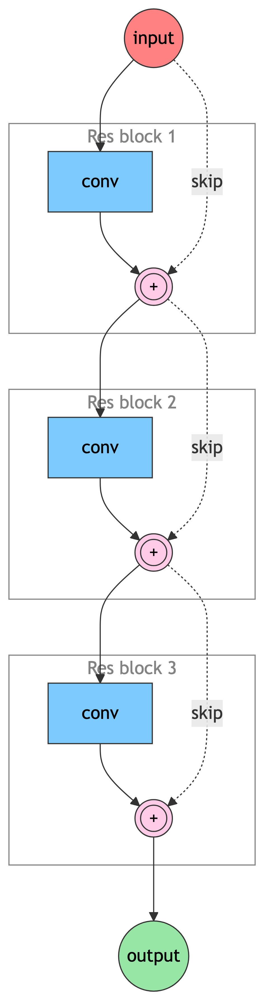
<figcaption>Figure 11: ResNet stacks residual blocks; each block’s skip
connection lets gradients flow directly to earlier layers.</figcaption>
</figure>

### U-Nets

U-NET is a convolution based neural network architecture orginally
developed for biomedical image segmentation tasks. It has an
encoder-decoder architecture with skip connections in between them.

<figure id="fig-u-nets">
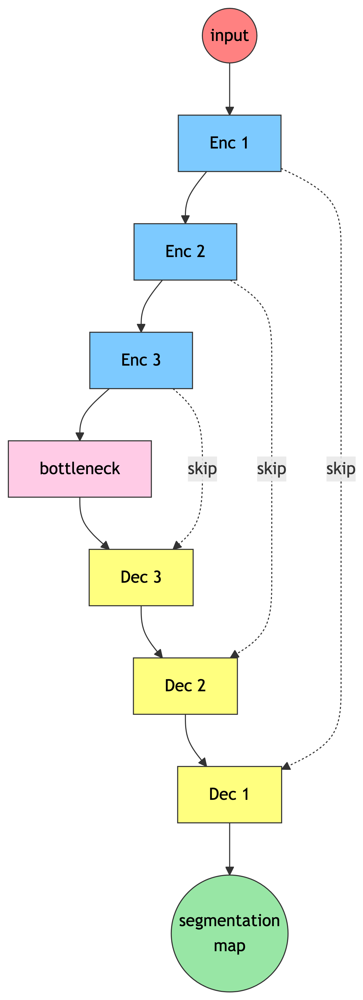
<figcaption>Figure 12: U-Net’s encoder–decoder (“U”) shape with
<strong>skip connections</strong> copying encoder features across to the
matching decoder stage.</figcaption>
</figure>

### ViTs

You’ll learn about language models today, which use “transformer”
models. There has been some success applying transformers to images
(“vision transformers”). To make images sequential, they are split into
patches and flattened. Then apply linear embeddings and positional
embeddings and feed it to a encoder-based transformer model.

<figure id="fig-vits">
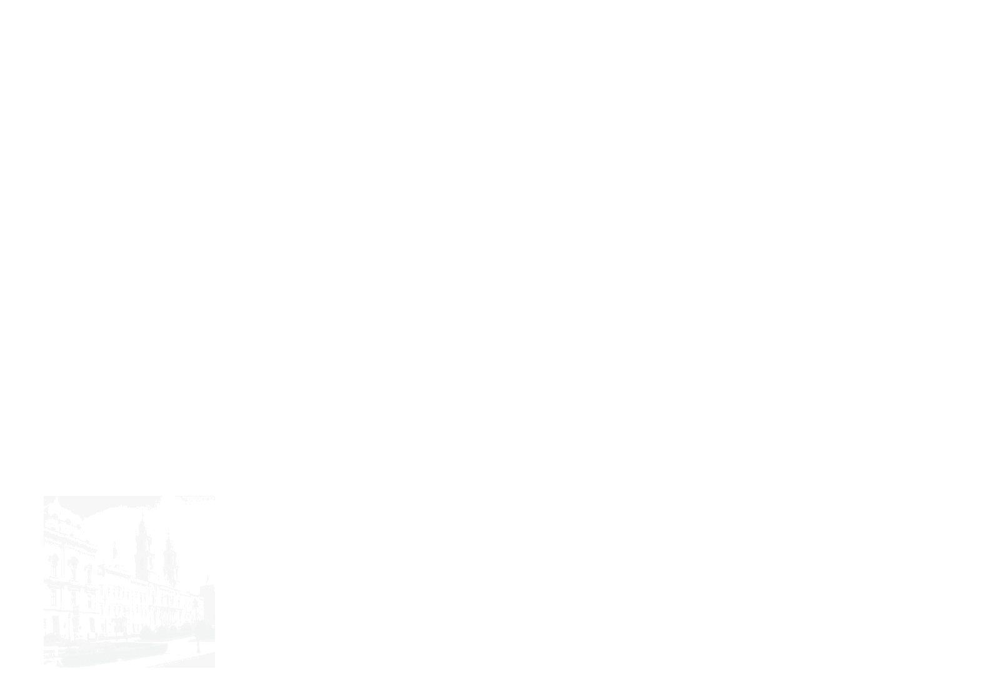
<figcaption>Figure 13: Image credit: <a
href="https://ai.googleblog.com/2020/12/transformers-for-image-recognition-at.html">Google
Blog</a></figcaption>
</figure>